# Manifold Optimizer Experiment

### Imports

In [ ]:
import hashlib

from dataclasses import dataclass
from typing import (
    Dict,
    Any,
    Optional,
    Tuple,
)

import numpy as np
import pandas as pd

from cuml.manifold import UMAP

from pacmap import PaCMAP

import optuna

from config import Config
from projector import Projector
from optimizer import Optimizer
from nearest_neighbors import precompute_nearest_neighbors, convert_knn_to_pairs
from visualization import plot_data, export_plot_grid
from metrics import EvaluationMetric, build_ca_metric_key

### Load configuration

In [2]:
CONFIG = Config(
    # Database settings
    BINARY_EMBEDDING=False,
    DB_NAME="skfp_atompair_fp4096_folded_dense_count",
)

### Load data from parquet

In [3]:
fetched_data: pd.DataFrame = pd.read_parquet(
    CONFIG.DATA_DIR_PATH / CONFIG.DB_NAME / "data.parquet"
)

X = np.array(
    fetched_data["embedding"].to_list(),
    dtype=np.uint8 if CONFIG.BINARY_EMBEDDING else np.uint64,
)

compound_metadata = pd.json_normalize(fetched_data["metadata"].to_list())

compound_metadata.head()

,Class,Kingdom,SMILES,Subclass,Superclass,inchikey
0,Carboxylic acids and derivatives,Organic compounds,CCCC1=CC(=O)OC2=CC(=C(C=C12)Cl)OC(=O)C(CCSC)NC...,"Amino acids, peptides, and analogues",Organic acids and derivatives,MMRLDKZTTIAAKW-UHFFFAOYSA-N
1,Carboxylic acids and derivatives,Organic compounds,CCCCCC=CCC=CCC=CCC=CCCCC(=O)NCCCC(=O)O,"Amino acids, peptides, and analogues",Organic acids and derivatives,JKUDIEXTAYKJNX-UHFFFAOYSA-N
2,Carboxylic acids and derivatives,Organic compounds,CC(C)(C)NC(=O)C1CCCN1C(C2CC2)C(=O)NC,"Amino acids, peptides, and analogues",Organic acids and derivatives,PTANEMHWZGESKG-UHFFFAOYSA-N
3,Carboxylic acids and derivatives,Organic compounds,C1=CC(=CC(=C1)Cl)C(C(=O)O)N,"Amino acids, peptides, and analogues",Organic acids and derivatives,MGOUENCSVMAGSE-SSDOTTSWSA-N
4,Carboxylic acids and derivatives,Organic compounds,C1=CC=C(C=C1)CC(C(=O)NC(CCC(=O)N)C(=O)NCC(=O)O...,"Amino acids, peptides, and analogues",Organic acids and derivatives,UIFCMNRIWMDBJS-UHFFFAOYSA-N


### Subset sampling

In [4]:
n_total = int(len(compound_metadata) * 0.05)  # target subset size of 5%
series = compound_metadata["Subclass"].fillna("Unknown")
sample_per_class = n_total // series.nunique()

subset_indices = (
    compound_metadata.groupby(series, group_keys=False)
    .apply(
        lambda group: group.sample(
            n=min(len(group), sample_per_class), random_state=CONFIG.RANDOM_SEED
        )
    )
    .index.to_numpy()
)

print(
    f"Unique classes: {series.nunique()}  |  Target per class: {sample_per_class}  |  Subset size: {len(subset_indices)}"
)

subset_hash = hashlib.sha256(X[subset_indices].tobytes()).hexdigest()

hash_path = CONFIG.DATA_DIR_PATH / CONFIG.DB_NAME / "subset_hash.txt"
try:
    existing_hash = hash_path.read_text().strip()
    if existing_hash == subset_hash:
        print("Subset hash matches. Reproducibility verified.")
    else:
        raise ValueError(
            f"Subset hash mismatch! The subset may have changed since the last run. Expected: {existing_hash}, Got: {subset_hash}"
        )
except FileNotFoundError:
    print("WARNING: No existing hash found. Saving subset hash.")
    hash_path.write_text(subset_hash)


Unique classes: 120  |  Target per class: 50  |  Subset size: 6000
Subset hash matches. Reproducibility verified.


## Nearest Neighbor Precomputation

In [5]:
knn_indices_cosine, knn_distances_cosine = precompute_nearest_neighbors(
    dataset=X, n_neighbors=150, algorithm="brute", metric="cosine"
)

## Experiment

### UMAP Projector

In [6]:
def fit_umap_model(
    data: np.ndarray,
    metric: str = "cosine",
    min_dist: float = 0.1,
    spread: float = 1.0,
    n_neighbors: int = 30,
    precomputed_knn: Optional[Tuple[np.ndarray, np.ndarray]] = None,
    verbose: bool = False,
):
    umap_model = UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        spread=spread,
        precomputed_knn=precomputed_knn,
        build_algo="auto",
        metric=metric,
        verbose=verbose,
        n_components=2,
        random_state=CONFIG.RANDOM_SEED,
    )
    umap_model.fit(data)

    return umap_model


def umap_transform(
    data: np.ndarray,
    umap_model: UMAP,
):
    UMAP_X_2d = np.asarray(umap_model.transform(data))

    return UMAP_X_2d


In [7]:
@dataclass
class UMAPProjector(Projector):
    parameter_map = {
        "n_neighbors": [5, 10, 15, 20, 25, 30, 40, 50, 75, 100, 125, 150],
        "min_dist": [0.0, 0.1, 0.2, 0.25, 0.5, 0.75, 1.0],
        "spread": [1.0],
        "metric": ["cosine"],
    }

    def suggest_params(self, trial: optuna.Trial) -> Dict[str, Any]:
        return {
            "n_neighbors": trial.suggest_int(
                "n_neighbors",
                self.parameter_map["n_neighbors"][0],
                self.parameter_map["n_neighbors"][-1],
            ),
            "min_dist": trial.suggest_float(
                "min_dist",
                self.parameter_map["min_dist"][0],
                self.parameter_map["min_dist"][-1],
                step=0.05,
            ),
            "spread": trial.suggest_float(
                "spread",
                self.parameter_map["spread"][0],
                self.parameter_map["spread"][-1],
                step=0.5,
            ),
            "metric": trial.suggest_categorical("metric", self.parameter_map["metric"]),
        }

    def project(
        self,
        data: np.ndarray,
        subset_index_array: np.ndarray,
        params: Dict[str, Any],
    ) -> np.ndarray:
        umap_model = fit_umap_model(
            data=data,
            n_neighbors=params["n_neighbors"],
            min_dist=params["min_dist"],
            spread=params["spread"],
            metric=params["metric"],
            precomputed_knn=(knn_indices_cosine, knn_distances_cosine) if params["metric"] == "cosine" else None,
        )

        return umap_model.embedding_[subset_index_array]


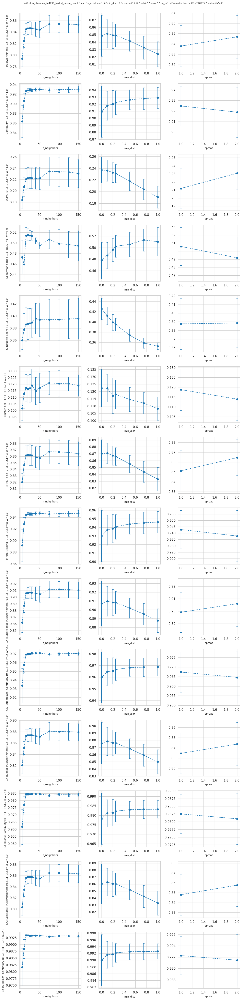

In [10]:
umap_op = Optimizer(
    projector=UMAPProjector(),
    data=X,
    compound_metadata=compound_metadata,
    subset_indices=subset_indices,
    experiment_name=f"UMAP {CONFIG.DB_NAME}",
    ca_classes=["Superclass", "Class", "Subclass"],
)

# Load the study if it exists, otherwise start fresh
umap_op.load_study_if_exists()

# Run grid search or optimizer or both as needed
# umap_op.run_grid_search()
# umap_op.run_optimizer(n_iterations=50)

assert umap_op.study is not None and umap_op.results_df is not None, (
    "Study results should be available after running the experiment."
)

umap_best_score = umap_op.get_best_params(EvaluationMetric.CONTINUITY)

umap_op.plot_statistics(
    line_parameter="metric",
    excluded_parameters=[],
    best_parameter=umap_best_score,
)

In [15]:
def get_available_metrics(ca_classes: list = []) -> list:
    ca_metrics = [
        build_ca_metric_key(EvaluationMetric.CA_TRUSTWORTHINESS, class_name)
        for class_name in ca_classes
    ]
    other_metrics = list(EvaluationMetric)
    other_metrics = [
        metric for metric in other_metrics if not metric.name.startswith("CA_")
    ]
    return ca_metrics + other_metrics


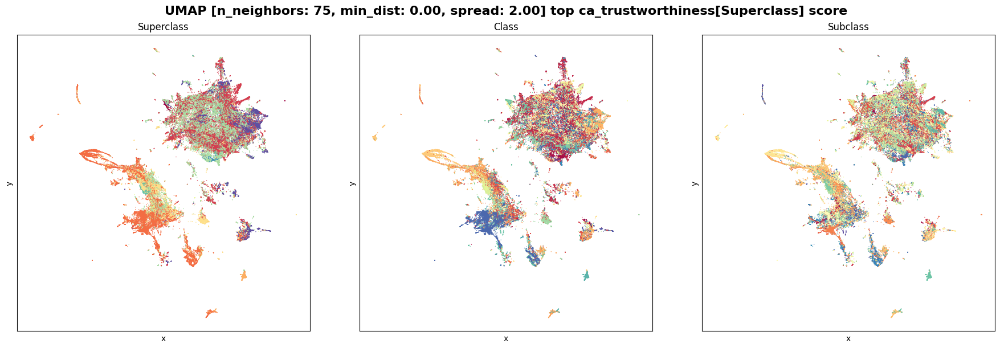

Saved 3 panel(s) in a 1x3 grid to: umap_ca_trustworthiness[Superclass].png


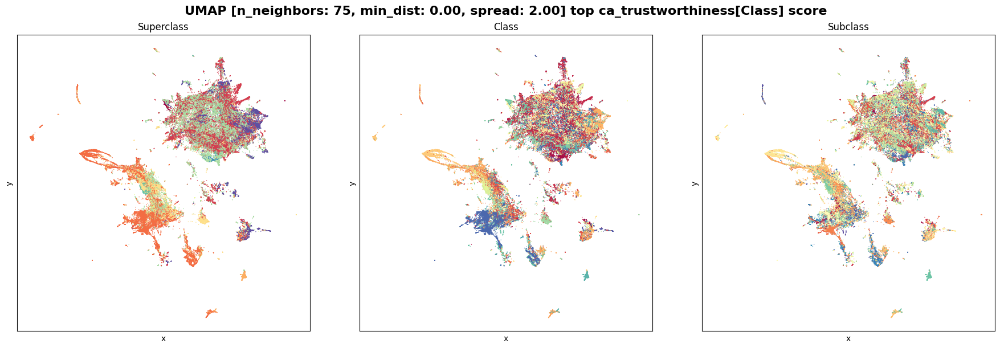

Saved 3 panel(s) in a 1x3 grid to: umap_ca_trustworthiness[Class].png


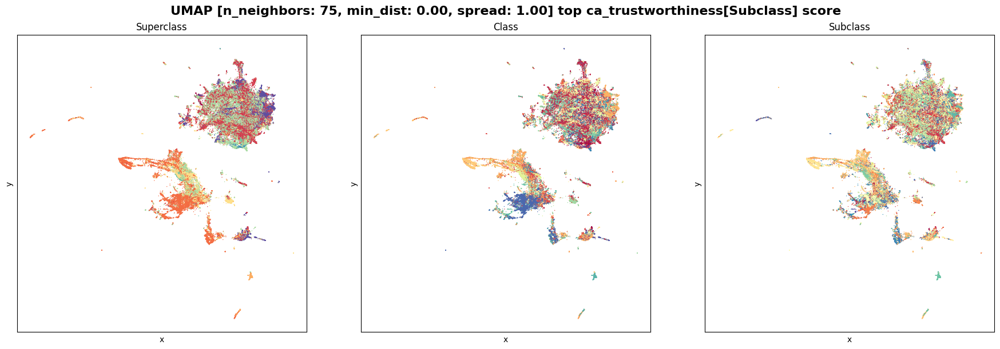

Saved 3 panel(s) in a 1x3 grid to: umap_ca_trustworthiness[Subclass].png


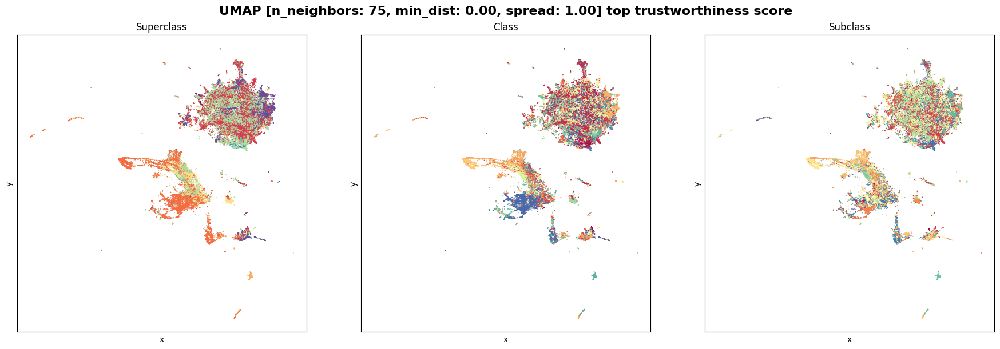

Saved 3 panel(s) in a 1x3 grid to: umap_trustworthiness.png


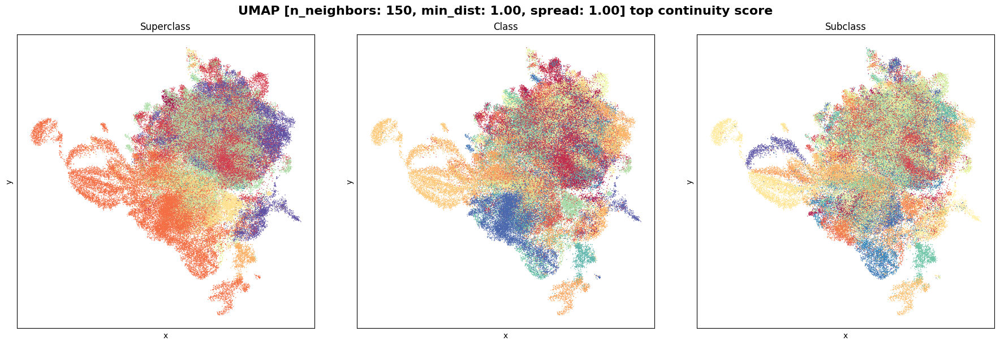

Saved 3 panel(s) in a 1x3 grid to: umap_continuity.png


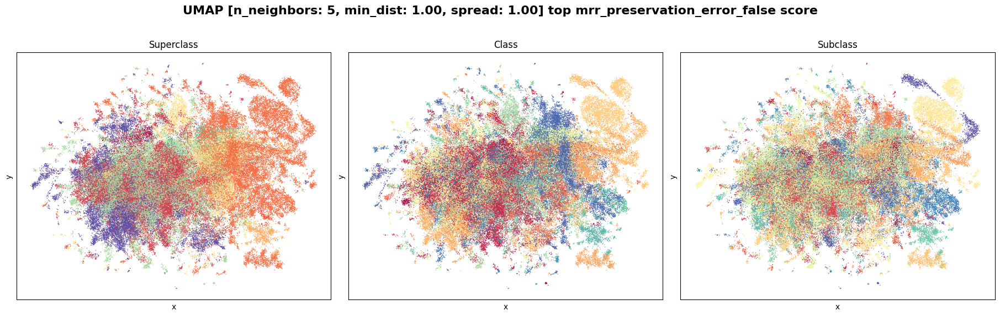

Saved 3 panel(s) in a 1x3 grid to: umap_mrr_preservation_error_false.png


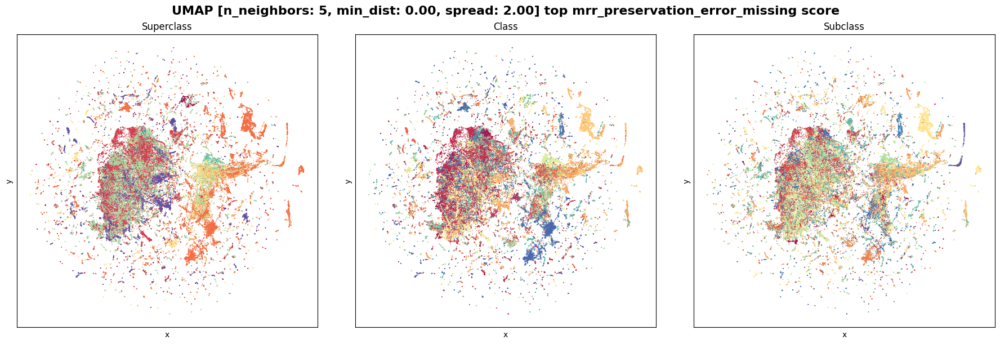

Saved 3 panel(s) in a 1x3 grid to: umap_mrr_preservation_error_missing.png


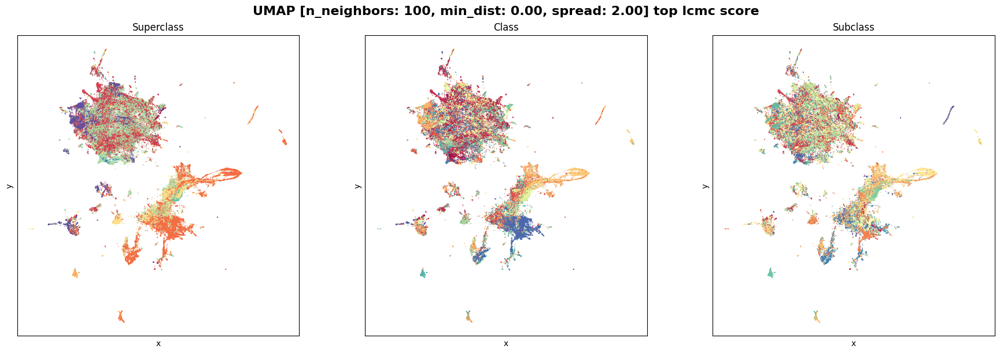

Saved 3 panel(s) in a 1x3 grid to: umap_lcmc.png


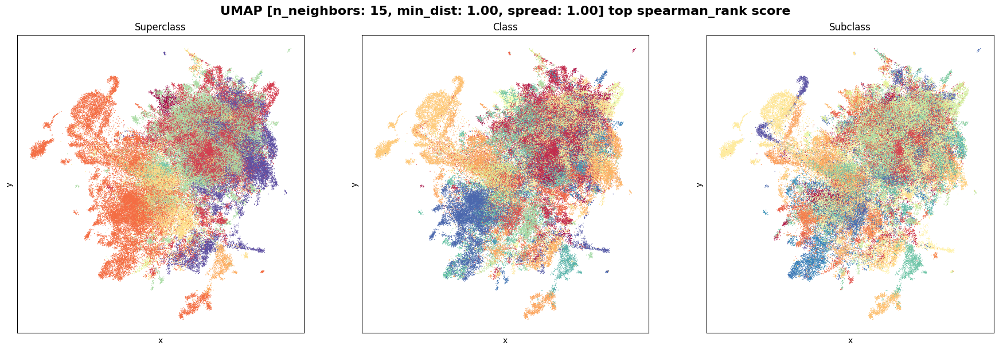

Saved 3 panel(s) in a 1x3 grid to: umap_spearman_rank.png


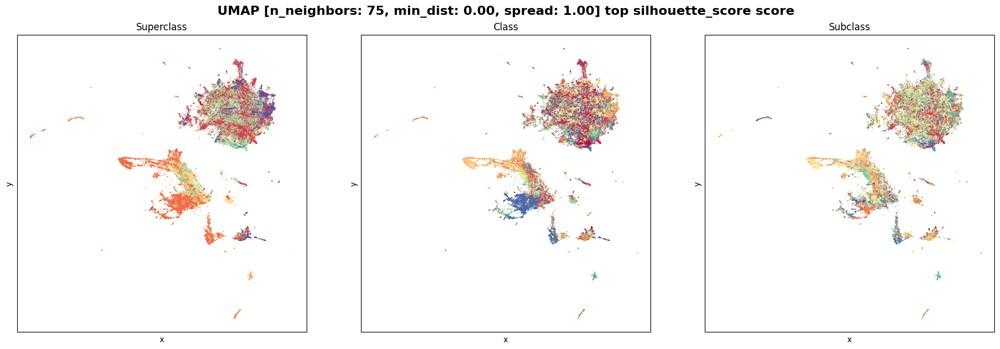

Saved 3 panel(s) in a 1x3 grid to: umap_silhouette_score.png


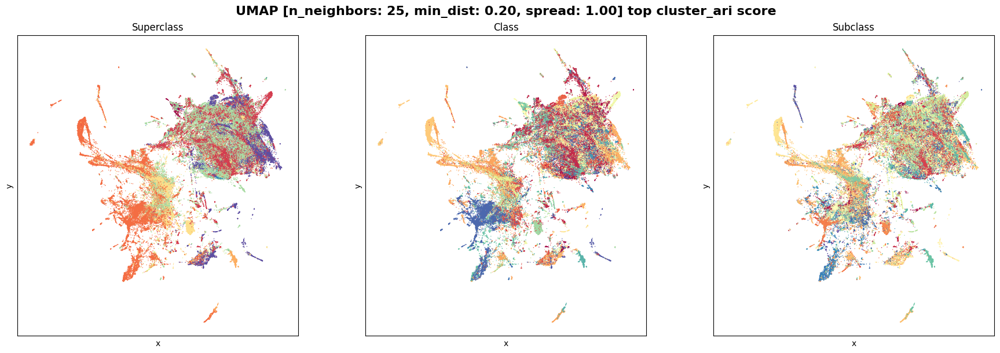

Saved 3 panel(s) in a 1x3 grid to: umap_cluster_ari.png


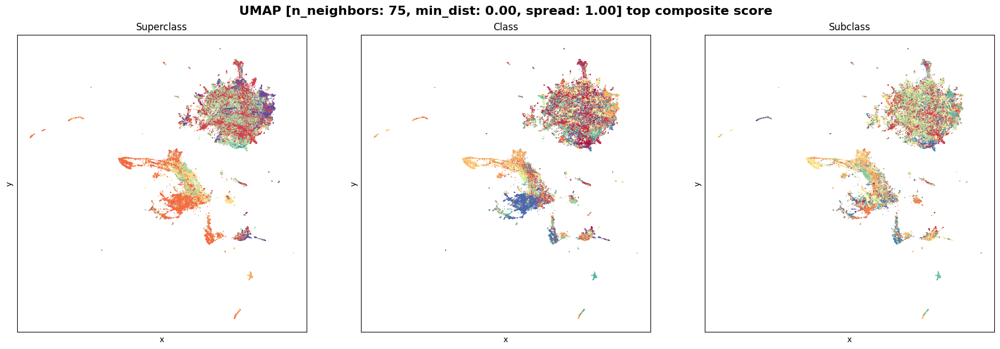

Saved 3 panel(s) in a 1x3 grid to: umap_composite.png


In [ ]:
for metric in get_available_metrics(["Superclass", "Class", "Subclass"]):
    umap_best_score = umap_op.get_best_params(
        metric=metric,
        high_is_better=metric
        not in [
            EvaluationMetric.MEAN_RELATIVE_RANK_PRESERVATION_ERROR_FALSE,
            EvaluationMetric.MEAN_RELATIVE_RANK_PRESERVATION_ERROR_MISSING,
        ],
    )

    umap_model = fit_umap_model(
        data=X,
        metric=umap_best_score["metric"],
        n_neighbors=umap_best_score["n_neighbors"],
        spread=umap_best_score["spread"],
        min_dist=umap_best_score["min_dist"],
        precomputed_knn=(knn_indices_cosine, knn_distances_cosine)
        if umap_best_score["metric"] == "cosine"
        else None,
    )

    export_plot_grid(
        embedding=umap_model.embedding_,
        color_cols=["Superclass", "Class", "Subclass"],
        matched_compounds=compound_metadata,
        plot_title=f"UMAP [n_neighbors: {umap_model.n_neighbors}, min_dist: {umap_model.min_dist:.2f}, spread: {umap_model.spread:.2f}] top {umap_best_score['top_by']} score",
        filename=f"umap_{metric}.png",
        point_size=1.0,
        n_cols=3,
        panel_size=6.0,
    )


In [11]:
umap_model = fit_umap_model(
    data=X,
    metric=umap_best_score["metric"],
    n_neighbors=umap_best_score["n_neighbors"],
    spread=umap_best_score["spread"],
    min_dist=umap_best_score["min_dist"],
    precomputed_knn=(knn_indices_cosine, knn_distances_cosine)
    if umap_best_score["metric"] == "cosine"
    else None,
)
plot_data(
    data=umap_model.embedding_,
    matched_compounds=compound_metadata,
    marker_size=0.9,
    plot_title=f"UMAP [n_neighbors: {umap_model.n_neighbors}, min_dist: {umap_model.min_dist}, spread: {umap_model.spread}]",
    color_col="Superclass",
    url=CONFIG.DASHBOARD_DOMAIN,
)

/home/s6l6m/Documents/GitHub/bachelorabeit_sandbox/.venv/lib/python3.11/site-packages/dash/dash.py:644: UserWarning: JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.
  warnings.warn(


Plot running on port 36655 http://localhost:36655


### PaCMAP Projector

In [11]:
def fit_pacmap_model(
    data: np.ndarray,
    knn_indices: Optional[np.ndarray] = None,
    distance: str = "angular",
    n_neighbors: int = 30,
    mn_ratio: float = 0.5,
    fp_ratio: float = 1.0,
    verbose: bool = False,
) -> PaCMAP:
    if knn_indices is not None:
        pair_neighbors = convert_knn_to_pairs(knn_indices, n_neighbors)
    else:
        pair_neighbors = None

    pacmap_model = PaCMAP(
        n_neighbors=n_neighbors,
        pair_neighbors=pair_neighbors,
        MN_ratio=mn_ratio,
        FP_ratio=fp_ratio,
        save_tree=True,
        distance=distance,
        verbose=verbose,
    )
    pacmap_model.fit(data)
    return pacmap_model


def pacmap_transform(
    data: np.ndarray,
    pacmap_model: PaCMAP,
):
    PaCMAP_X_2d = np.asarray(pacmap_model.transform(data))

    return PaCMAP_X_2d


In [12]:
@dataclass
class PaCMAPProjector(Projector):
    parameter_map = {
        "n_neighbors": [5, 10, 15, 20, 25, 30, 50, 75, 100, 125, 150],
        "mn_ratio": [0.1, 0.25, 0.5, 1.0],
        "fp_ratio": [0.5, 1.0, 2.0, 5.0],
        "distance": ["angular"],
    }

    def suggest_params(self, trial: optuna.Trial) -> Dict[str, Any]:
        return {
            "n_neighbors": trial.suggest_int(
                "n_neighbors",
                self.parameter_map["n_neighbors"][0],
                self.parameter_map["n_neighbors"][-1],
            ),
            "mn_ratio": trial.suggest_float(
                "mn_ratio",
                self.parameter_map["mn_ratio"][0],
                self.parameter_map["mn_ratio"][-1],
                step=0.1,
            ),
            "fp_ratio": trial.suggest_float(
                "fp_ratio",
                self.parameter_map["fp_ratio"][0],
                self.parameter_map["fp_ratio"][-1],
                step=0.1,
            ),
            "distance": trial.suggest_categorical(
                "distance", self.parameter_map["distance"]
            ),
        }

    def project(
        self,
        data: np.ndarray,
        subset_index_array: np.ndarray,
        params: Dict[str, Any],
    ) -> np.ndarray:
        knn_indices = None
        if params["distance"] == "angular":
            knn_indices = knn_indices_cosine

        pacmap_model = fit_pacmap_model(
            data=data,
            knn_indices=knn_indices,
            n_neighbors=params["n_neighbors"],
            distance=params["distance"],
            mn_ratio=params["mn_ratio"],
            fp_ratio=params["fp_ratio"],
        )
        return pacmap_model.embedding_[subset_index_array]


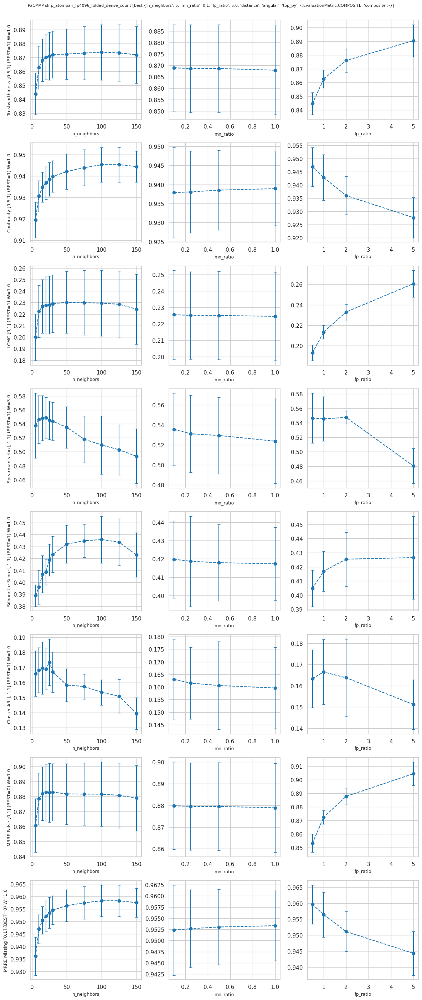

In [ ]:
pacmap_op = Optimizer(
    projector=PaCMAPProjector(),
    data=X,
    compound_metadata=compound_metadata,
    subset_indices=subset_indices,
    experiment_name=f"PaCMAP {CONFIG.DB_NAME}",
    ca_classes=["Superclass", "Class", "Subclass"],
)

pacmap_op.load_study_if_exists()

# Run grid search or optimizer or both as needed
# pacmap_op.run_grid_search()
# pacmap_op.run_optimizer(n_iterations=50)

assert pacmap_op.study is not None, (
    "Study should be available after running grid search."
)

pacmap_best_score = pacmap_op.get_best_params(metric=EvaluationMetric.COMPOSITE)
pacmap_op.plot_statistics(line_parameter="distance", best_parameter=pacmap_best_score)


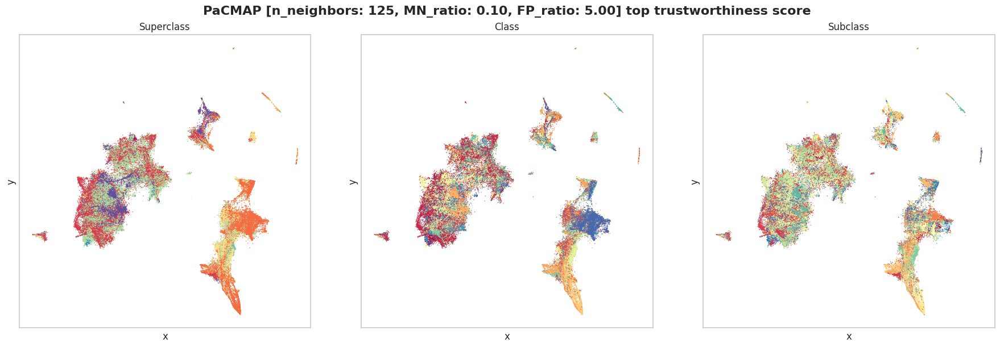

Saved 3 panel(s) in a 1x3 grid to: pacmap_trustworthiness.png


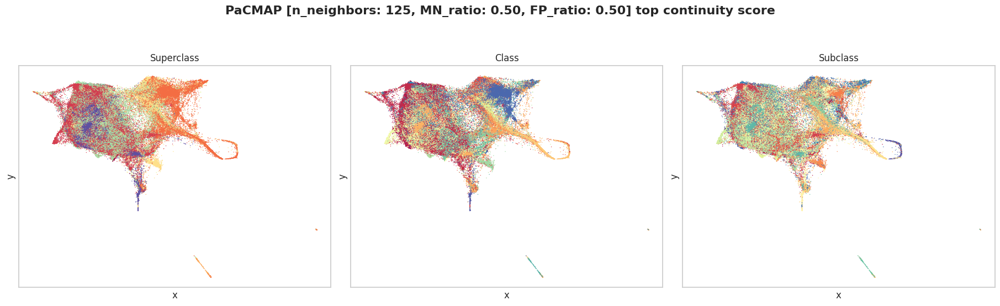

Saved 3 panel(s) in a 1x3 grid to: pacmap_continuity.png


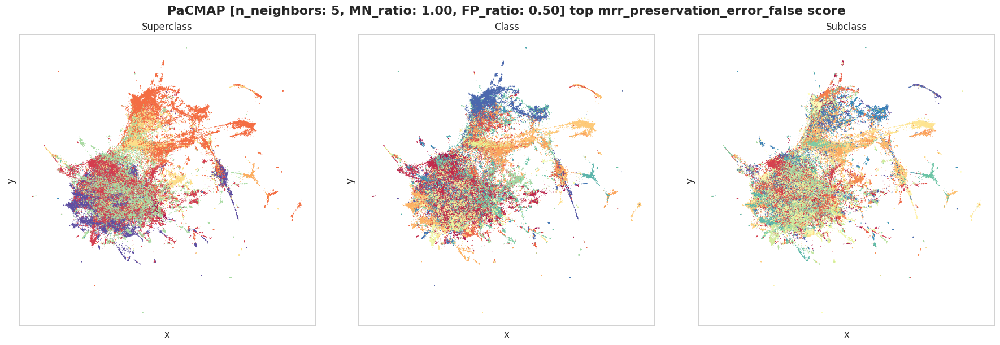

Saved 3 panel(s) in a 1x3 grid to: pacmap_mrr_preservation_error_false.png


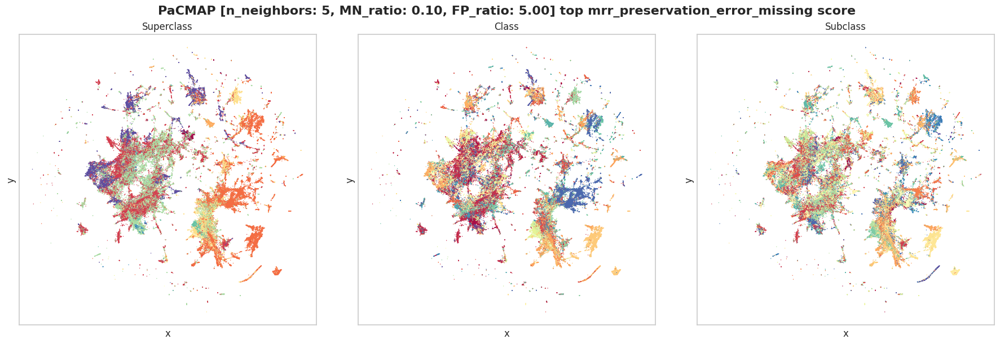

Saved 3 panel(s) in a 1x3 grid to: pacmap_mrr_preservation_error_missing.png


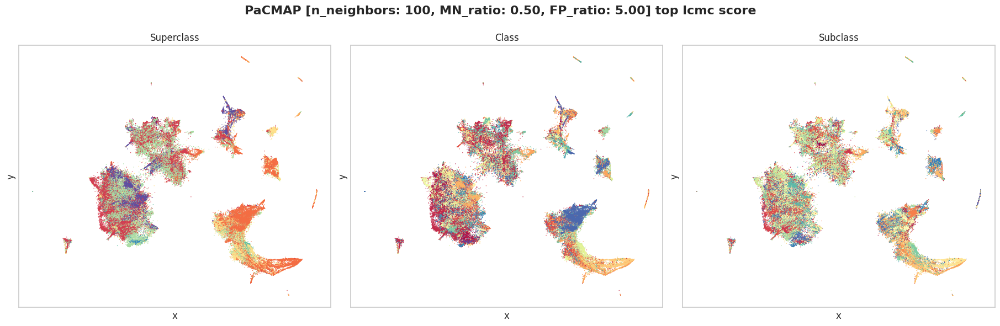

Saved 3 panel(s) in a 1x3 grid to: pacmap_lcmc.png


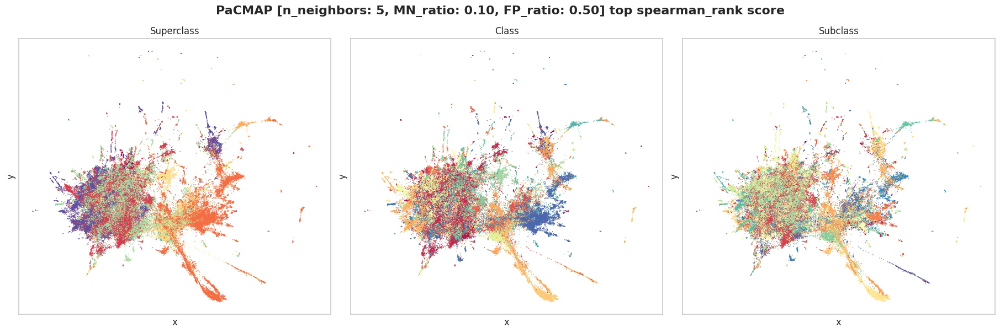

Saved 3 panel(s) in a 1x3 grid to: pacmap_spearman_rank.png


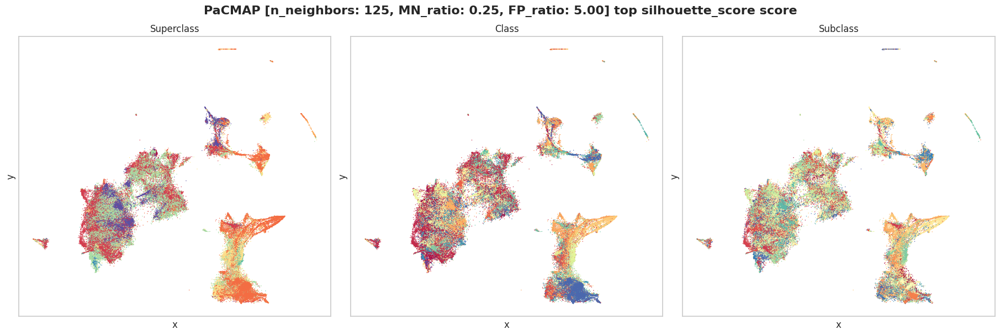

Saved 3 panel(s) in a 1x3 grid to: pacmap_silhouette_score.png


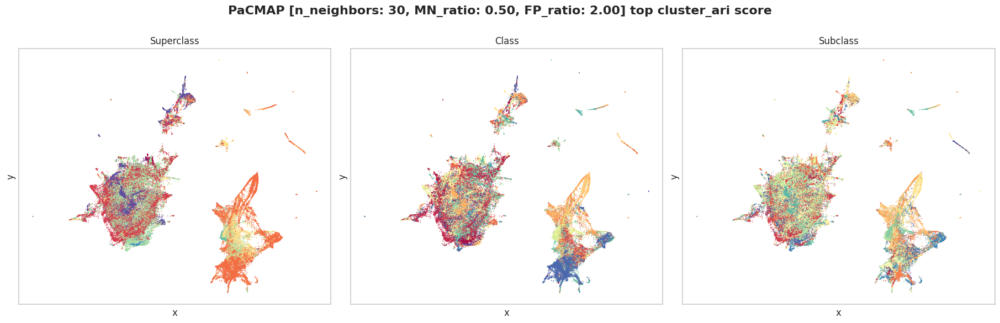

Saved 3 panel(s) in a 1x3 grid to: pacmap_cluster_ari.png


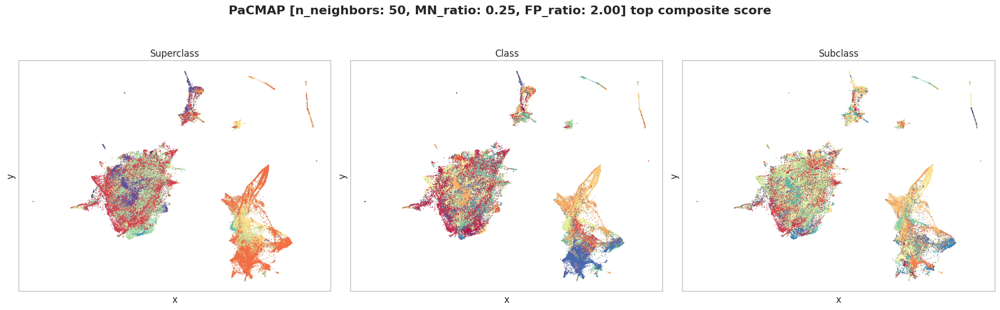

Saved 3 panel(s) in a 1x3 grid to: pacmap_composite.png


In [16]:
for metric in get_available_metrics():
    pacmap_best_score = pacmap_op.get_best_params(
        metric=metric,
        high_is_better=metric
        not in [
            EvaluationMetric.MEAN_RELATIVE_RANK_PRESERVATION_ERROR_FALSE,
            EvaluationMetric.MEAN_RELATIVE_RANK_PRESERVATION_ERROR_MISSING,
        ],
    )
    pacmap_model = fit_pacmap_model(
        data=X,
        knn_indices=knn_indices_cosine
        if pacmap_best_score["distance"] == "angular"
        else None,
        distance=pacmap_best_score["distance"],
        n_neighbors=pacmap_best_score["n_neighbors"],
        mn_ratio=pacmap_best_score["mn_ratio"],
        fp_ratio=pacmap_best_score["fp_ratio"],
        verbose=False,
    )
    export_plot_grid(
        embedding=pacmap_model.embedding_,
        color_cols=["Superclass", "Class", "Subclass"],
        matched_compounds=compound_metadata,
        plot_title=f"PaCMAP [n_neighbors: {pacmap_model.n_neighbors}, MN_ratio: {pacmap_model.MN_ratio:.2f}, FP_ratio: {pacmap_model.FP_ratio:.2f}] top {pacmap_best_score['top_by']} score",
        filename=f"pacmap_{metric}.png",
        point_size=1.0,
        n_cols=3,
        panel_size=6.0,
    )


In [ ]:
plot_data(
    data=pacmap_model.embedding_,
    matched_compounds=compound_metadata,
    marker_size=1.5,
    plot_title=f"PaCMAP: {CONFIG.DB_NAME}",
    color_col="Superclass",
)